In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, RandomForestRegressor
from sklearn.metrics import confusion_matrix, multilabel_confusion_matrix, roc_curve, recall_score, roc_auc_score, mean_squared_error, mean_absolute_error
from math import sqrt, log
from sklearn.metrics import accuracy_score, classification_report, r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import RidgeClassifier
import graphviz

from sklearn.tree import tree, export_graphviz, DecisionTreeClassifier, DecisionTreeRegressor
from sklearn import tree
from matplotlib import pyplot as plt
from IPython.display import Image, display
from sklearn.utils import class_weight
%matplotlib inline
plt.style.use('ggplot')
SEED = 42

pd.set_option('display.max_columns', 500)


/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.tree.tree module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.tree. Anything that cannot be imported from sklearn.tree is now part of the private API.
  warnings.warn(message, FutureWarning)


In [11]:
df = pd.read_csv("../data/raw_datasets/Interest rates/LoanStats3d_securev1 2.csv")
df_2013 = download_df("../data/raw_datasets/Interest rates/2013 Data.csv") 
#df_dict = pd.read_excel("LCDataDictionary (1).xlsx")

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3249: DtypeWarning: Columns (0,129,130,131,134,135,136,139) have mixed types. Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [11]:
df.head(10)
#loan_amnt: application
#funded_amnt: total amount given 
#funded_amnt_inv: amount given by the investors (case in which investors provide a part and investors)

#the platform may decide or not to allocate
#grade: A is best and F the worst 
#subgrade: Within the grade different levels
#term: how long
#interest rate per month: based on the remaining balance
#emp_length: for how long they work for the employer
#annual income
#verification_status: whether the income was checked
#issues date of the loan issue: 

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,10224583,NaN,11100.0,11100.0,11100.0,36 months,14.98%,384.68,C,C3,Teacher,10+ years,MORTGAGE,90000.0,Not Verified,Dec-2013,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,Other,103xx,NY,3.73,1.0,Jun-2001,690.0,694.0,0.0,16.0,NaN,9.0,0.0,6619.0,66.2%,12.0,f,0.0,0.0,13575.640006,13575.64,11100.0,2475.64,0.0,0.0,0.0,Feb-2016,4343.32,NaN,Jun-2018,779.0,775.0,0.0,16.0,1.0,Individual,NaN,NaN,NaN,0.0,0.0,353402.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.0,NaN,NaN,NaN,2.0,39267.0,1016.0,74.6,0.0,0.0,NaN,150.0,11.0,11.0,1.0,11.0,35.0,11.0,35.0,1.0,4.0,8.0,4.0,4.0,0.0,8.0,11.0,8.0,9.0,0.0,0.0,1.0,1.0,75.0,50.0,0.0,0.0,385000.0,6619.0,4000.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN
1,10148122,NaN,12000.0,12000.0,12000.0,36 months,7.62%,373.94,A,A3,Systems Engineer,3 years,MORTGAGE,96500.0,Not Verified,Dec-2013,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/31/13 > Bought a new ho...,debt_consolidation,Debt Consolidation and Credit Transfer,782xx,TX,12.61,0.0,Sep-2003,705.0,709.0,0.0,NaN,NaN,17.0,0.0,13248.0,55.7%,30.0,f,0.0,0.0,13397.539998,13397.54,12000.0,1397.54,0.0,0.0,0.0,Jun-2016,2927.22,NaN,Mar-2020,809.0,805.0,0.0,NaN,1.0,Individual,NaN,NaN,NaN,0.0,0.0,200314.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23800.0,NaN,NaN,NaN,4.0,11783.0,2441.0,83.5,0.0,0.0,123.0,118.0,10.0,9.0,1.0,10.0,NaN,10.0,NaN,0.0,4.0,5.0,4.0,10.0,15.0,8.0,14.0,5.0,17.0,0.0,0.0,0.0,3.0,100.0,100.0,0.0,0.0,233004.0,46738.0,14800.0,5340

In [24]:
df[(df["sub_grade"] == "C4") & (df["int_rate"] == "  6.00%")]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_il_6m,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog
15963,67278193,NaN,25000,25000,25000.0,60 months,6.00%,52.22,C,C4,Business Development Manager,1 year,MORTGAGE,125000.0,Source Verified,Dec-2015,Current,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,Debt consolidation,325xx,FL,12.59,2,Jun-2005,660,664,2,8.0,NaN,11,0,14021,48%,32,w,2057.84,2057.84,26397.26,26397.26,22942.16,3455.10,0.0,0.0,0.0,Apr-2017,52.22,May-2017,Apr-2017,644,640,1,8.0,1,INDIVIDUAL,NaN,NaN,NaN,0,0,211002,2.0,3.0,0.0,1.0,16.0,6329.0,29.0,1.0,1.0,13594.0,47.0,29200,2.0,4.0,6.0,4,19182,7606.0,64.1,0,0,111.0,126,1,1,3,26.0,16.0,0.0,16.0,1,1,2,3,5,13,6,15.0,2,11,0.0,0,1,2,93.7,33.3,0,0,244893,26915,21200,22155,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
150841,59572219,NaN,28000,28000,28000.0,60 months,6.00%,541.23,C,C4,Weather Forecaster,10+ years,RENT,81000.0,Not Verified,Sep-2015,Current,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,credit_card,Credit card refinancing,198xx,DE,25.95,0,Jan-1994,670,674,1,NaN,NaN,15,0,38772,84.5%,41,w,20018.54,20018.54,12046.45,12046.45,7981.46,4064.99,0.0,0.0,0.0,Apr-2017,541.23,May-2017,Apr-2017,679,675,0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,0,66968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45900,NaN,NaN,NaN,5,5581,2517.0,79.4,0,0,125.0,259,15,14,1,24.0,NaN,6.0,NaN,0,3,9,4,13,11,14,29.0,9,15,0.0,0,0,0,100.0,66.7,0,0,79737,66968,12200,33837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
207494,55717658,NaN,15000,15000,14975.0,36 months,6.00%,376.25,C,C4,DSP,4 years,RENT,60000.0,Not Verified,Jul-2015,Current,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,Debt consolidation,207xx,MD,8.30,0,Jan-2011,675,679,0,NaN,NaN,25,0,12864,39.8%,26,f,4748.65,4740.74,11937.18,11917.28,10251.35,1685.83,0.0,0.0,0.0,Apr-2017,400.00,May-2017,Apr-2017,654,650,0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,0,44706,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32300,NaN,NaN,NaN,11,1863,10226.0,47.8,0,0,46.0,54,3,3,0,3.0,NaN,10.0,NaN,0,8,11,12,12,6,19,20.0,11,25,0.0,0,0,4,100.0,27.3,0,0,64142,44706,19600,31842,NaN,NaN,Na

In [ ]:
#Question
#1) Why some guys who have a loan of 36 months and started in 2015 are still current (ex: id 68585839)
#2) Why dti is different than debt/income (ex: id 67278193)

# Preprocessing

In [5]:
def interest_as_int(df):
    
    df = df.copy()
    
    df["int_rate"] = df["int_rate"].str.replace("%", "")
    df["int_rate"] = df["int_rate"].astype("float")
    
    return df

df = interest_as_int(df)

In [6]:
def remove_lines_with_all_nan(df):
    
    df = df.dropna(thresh = 20, axis = 0)
    return df

remove_lines_with_all_nan(df).shape[0]

421095

In [7]:
df["fico_mean"] = (df["fico_range_low"] + df["fico_range_high"])/2

In [8]:
def drop_na(df, thresh = 400000):
    
    df = df.dropna(thresh= thresh, axis = 1)
    
    for i in df.columns:
    
        df = df.dropna(subset = [i])
    
    return df

df_no_na = drop_na(df)

In [9]:
def remove_variables_no_need(df):
    
    df = df.set_index("id")
    
    df.drop(["funded_amnt", 
             "funded_amnt_inv", 
             "int_rate", 
             "installment", 
             "annual_inc", 
             "issue_d", 
             "loan_status", 
             "pymnt_plan", 
             "url", 
             "zip_code", 
             "addr_state", 
             "earliest_cr_line", 
             "fico_range_low", 
             "fico_range_high", "last_pymnt_d"])
    
    
    

# EDA

In [438]:
dti_by_grade = df.groupby("grade")["dti"].mean()
income_by_grade = df.groupby("grade")["annual_inc"].mean()
dti_by_subgrade = df.groupby("sub_grade")["dti"].mean()
income_by_subgrade = df.groupby("sub_grade")["annual_inc"].mean()
interest_rate_by_grade = df.groupby("grade")["int_rate"].mean()
interest_rate_by_subgrade = df.groupby("sub_grade")["int_rate"].mean()

interest_rate_by_grade_by_term = df.groupby(["grade", "term"])["int_rate"].mean()
loan_debt_by_grade = df.groupby("grade")["loan_amnt"].mean()

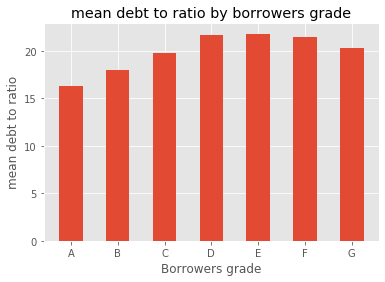

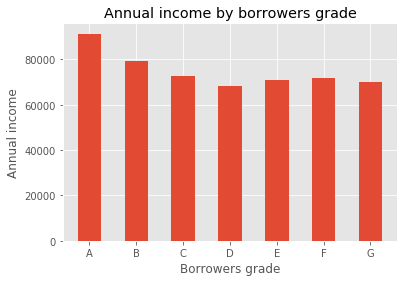

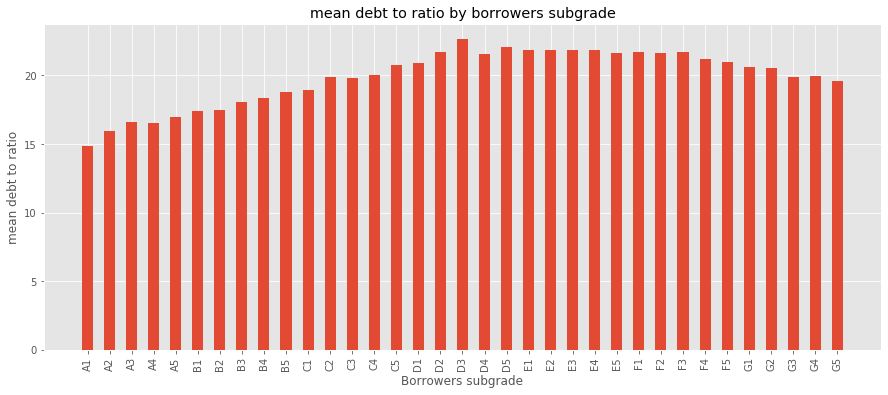

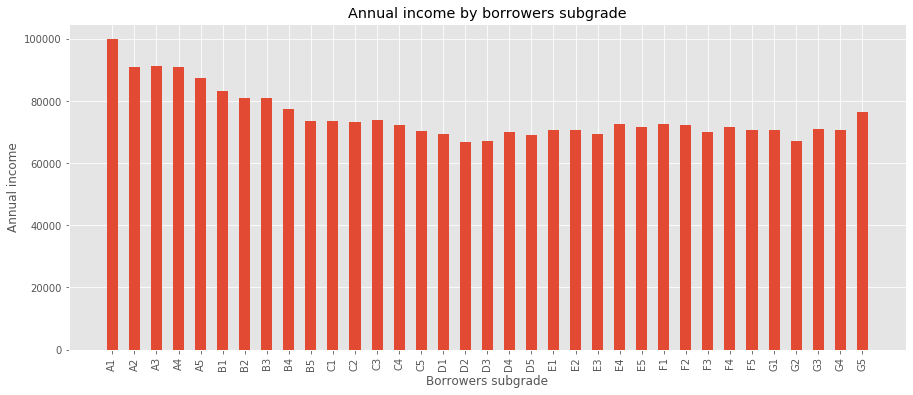

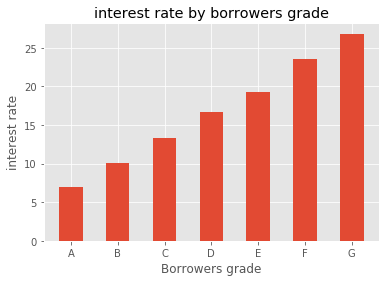

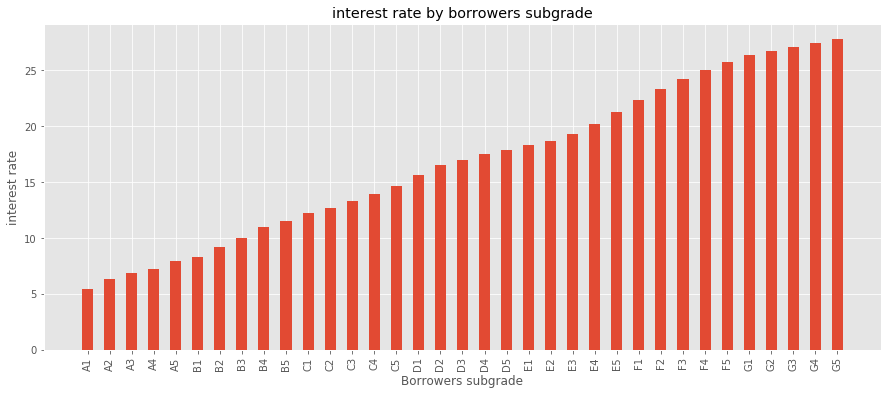

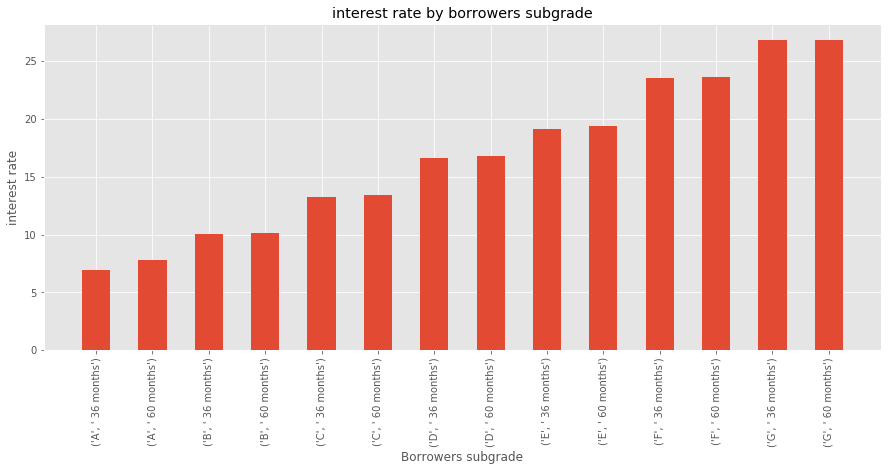

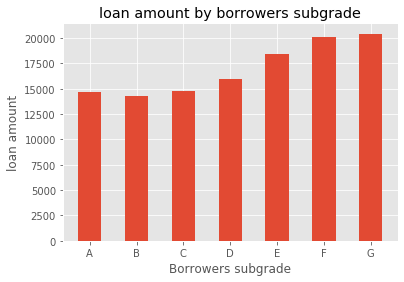

In [439]:
def build_bar_plot(col_name, bar_height, x_label, y_label, title):
    
    bar_positions = range(bar_height.size) 
    tick_positions = range(bar_height.size) 
    
    if bar_height.size > 10:
        fig, ax = plt.subplots(figsize = (15,6))
        plt.xticks(rotation=90)
    else:
        fig, ax = plt.subplots()
        
    ax.bar(bar_positions, bar_height, 0.5)
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(col_name)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)
    
    file_path = "../figures/Interest_rate_dataset/" + title + ".png"
    
    plt.savefig(file_path)
    plt.show()
    

build_bar_plot(dti_by_grade.index, 
               dti_by_grade, 
               "Borrowers grade", 
               "mean debt to ratio", 
               "mean debt to ratio by borrowers grade")

build_bar_plot(income_by_grade.index, 
               income_by_grade, 
               "Borrowers grade", 
               "Annual income", 
               "Annual income by borrowers grade")

build_bar_plot(dti_by_subgrade.index, 
               dti_by_subgrade, 
               "Borrowers subgrade", 
               "mean debt to ratio", 
               "mean debt to ratio by borrowers subgrade")

build_bar_plot(income_by_subgrade.index, 
               income_by_subgrade, 
               "Borrowers subgrade", 
               "Annual income", 
               "Annual income by borrowers subgrade")

build_bar_plot(interest_rate_by_grade.index, 
               interest_rate_by_grade, 
               "Borrowers grade", 
               "interest rate", 
               "interest rate by borrowers grade")

build_bar_plot(interest_rate_by_subgrade.index, 
               interest_rate_by_subgrade, 
               "Borrowers subgrade", 
               "interest rate", 
               "interest rate by borrowers subgrade")


build_bar_plot(interest_rate_by_grade_by_term.index, 
               interest_rate_by_grade_by_term, 
               "Borrowers subgrade", 
               "interest rate", 
               "interest rate by borrowers subgrade")

build_bar_plot(loan_debt_by_grade.index, 
               loan_debt_by_grade, 
               "Borrowers subgrade", 
               "loan amount", 
               "loan amount by borrowers subgrade")

In [17]:
def build_box_plot(item, df, x = "loan_status"):
    
    sns.boxplot(x = x, y = item[0], data = df.sort_values("loan_status"))
    
    if item[1][0] != False:
        plt.ylim((item[1][0], item[1][1]))
        
    file_path = "../figures/Interest_rate_dataset/" + item[0] + "_boxplot" + ".png"
    
    plt.savefig(file_path)
    plt.show()
    

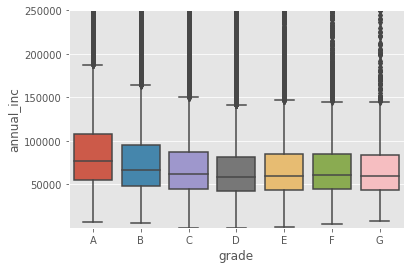

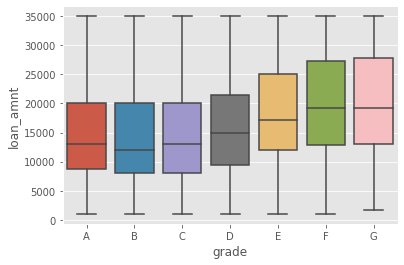

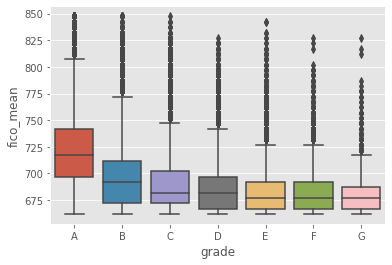

In [430]:
dict_box_plot = {"annual_inc":(50, 250000), "loan_amnt":(False, False), "fico_mean": (False, False)}

for i in dict_box_plot.items():
    build_box_plot(i, df)

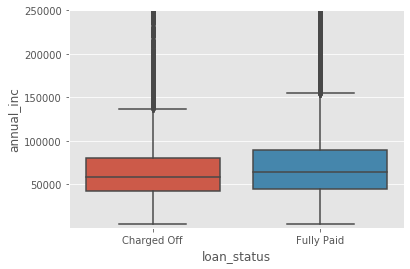

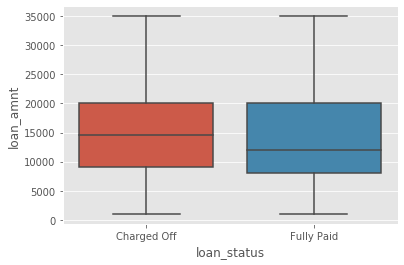

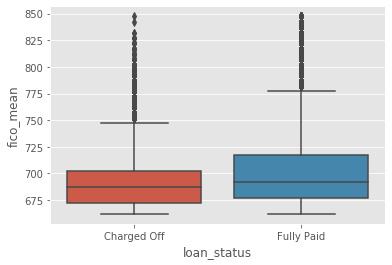

In [19]:
dict_box_plot = {"annual_inc":(50, 250000), "loan_amnt":(False, False), "fico_mean": (False, False)}

for i in dict_box_plot.items():
    build_box_plot(i, df_2013)

In [431]:
def get_term_proportion(series):
    
    prop_60 = ((series == " 60 months").sum()/series.size) * 100
    
    return prop_60


number_60_month_term_loan_by_grade = df.groupby("grade")["term"].agg(get_term_proportion)

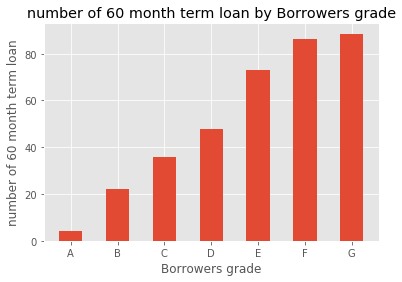

In [433]:
build_bar_plot(number_60_month_term_loan_by_grade.index, 
               number_60_month_term_loan_by_grade, 
               "Borrowers grade", 
               "number of 60 month term loan", 
               "number of 60 month term loan by Borrowers grade")

In [436]:
np.corrcoef(df["loan_amnt"], df["int_rate"])

array([[1.        , 0.14056108],
       [0.14056108, 1.        ]])

In [164]:
np.corrcoef(df["fico_mean"], df["int_rate"])

array([[ 1.        , -0.37620634],
       [-0.37620634,  1.        ]])

In [150]:
for subgrade in df["sub_grade"].sort_values().unique():
    print("subgrade ", subgrade, "there are ", df[df["sub_grade"] == subgrade]["int_rate"].nunique(), " different values")
    print("these values are: ", df[df["sub_grade"] == subgrade]["int_rate"].unique())
    
    

subgrade  A1 there are  3  different values
these values are:  [5.32 5.93 6.03]
subgrade  A2 there are  4  different values
these values are:  [6.49 6.24 6.   6.39]
subgrade  A3 there are  3  different values
these values are:  [6.99 6.89 6.68]
subgrade  A4 there are  4  different values
these values are:  [7.49 7.26 6.   6.92]
subgrade  A5 there are  4  different values
these values are:  [7.91 7.89 6.   8.19]
subgrade  B1 there are  5  different values
these values are:  [8.49 8.38 6.   8.18 8.67]
subgrade  B2 there are  3  different values
these values are:  [9.17 6.   9.49]
subgrade  B3 there are  5  different values
these values are:  [ 9.8   9.76  6.    9.99 10.49]
subgrade  B4 there are  5  different values
these values are:  [10.78 10.64  6.   10.99 11.44]
subgrade  B5 there are  6  different values
these values are:  [11.48 11.22  6.   11.49 11.53 11.99]
subgrade  C1 there are  5  different values
these values are:  [11.99 12.05  6.   12.29 12.39]
subgrade  C2 there are  5  di

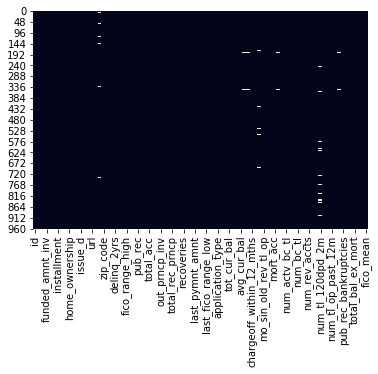

In [82]:
sns.heatmap(temp.head(1000).isnull(), cbar = False)

# First model attempt

In [12]:
models = {}

In [13]:
#df = df.set_index("id")

df_m1 = df[["loan_amnt", "term", "annual_inc", "fico_mean", "grade"]]

In [14]:
df_m1

,loan_amnt,term,annual_inc,fico_mean,grade
0,18000,60 months,150000.0,667.0,E
1,21000,60 months,52000.0,682.0,C
2,16000,60 months,142000.0,682.0,C
3,15700,60 months,48000.0,687.0,D
4,23850,60 months,68046.0,667.0,D
...,...,...,...,...,...
421090,10000,36 months,31000.0,672.0,B
421091,24000,36 months,79000.0,662.0,B
421092,12000,60 months,64400.0,697.0,E
421093,13000,60 months,35000.0,682.0,D


In [15]:
#convert string variables to categorical then to integers 
def encode(df):
    
    '''
    Encoding method 2
    
    Doing 1 hot encoding on the categorical variables (except the y variable)
        @df: Dataframes with predictors X and variable y (incone)
    '''
    
    df = df.copy()
    temp = df.drop(["term"], axis = 1)
    col_cat = df[["term"]]
    
    df_dummies = pd.get_dummies(col_cat)
    
    df = pd.concat([df_dummies, temp], axis=1)
    
    return df
    
df_m1_clean_hot_method = encode(df_m1)




In [16]:
def train_test_split_method(df, y_col, test_size = 0.15):
    '''
    Divides data into training and test set depending of the method of encoding
    
        @df_filter_students_with_income_clean_hot_method: Dataframe encoded with one hot encoding
        @df_filter_students_with_income_clean_cat_method: Dataframe encoded with cat encoding
        @hot: Boolean if hot encoding is used
    '''
    
    
    X = df.drop(y_col, axis = 1)
    y = df[y_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = SEED, stratify = y)
    
    return X_train, X_test, y_train, y_test


X_train, X_test, y_train, y_test = train_test_split_method(df_m1_clean_hot_method, "grade")



In [17]:
#all functions to evaluate a binary model
def plot_confusion_matrix_t(y_true, y_pred,classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    Prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.figure()
    
    
    
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    #classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots(figsize=(12,8))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

def get_features_importance(model, X):

    plt.figure()
    
    features_importance = pd.Series(model.feature_importances_, index = X.columns)

    sorted_importances_rf = features_importance.sort_values()[-10:]
  
    sorted_importances_rf.plot(kind = "barh", color = "purple")
    plt.show()
    
def get_roc_curve(model, treshold, X_val_or_test, y_val_or_test):
    
    plt.figure()
    print(treshold)
    y_pred_prob = model.predict_proba(X_val_or_test)[:, 1]
   
    fpr, tpr, tresholds = roc_curve(y_val_or_test, y_pred_prob)
    plt.plot([0, 1], [0, 1], "k--")
    plt.plot(fpr, tpr, label = "random forest")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Random Forest ROC Curve")
    plt.show()
    
def get_classification_table(y_pred, y_val_or_test):
    
    print(classification_report(y_val_or_test, y_pred))
    
def get_recall_metrics(cm, dict_diff, letter):
    
    line = dict_diff[letter]
    
    recall = (cm[line, line]/(cm[line,:].sum())) * 100
    
    return recall

def get_fpr_metrics(cm, dict_diff, letter):
    
    line = dict_diff[letter]
    
    fpr = (cm[line, line]/(cm[:, line].sum())) * 100
    
    return fpr

def build_bar_plot(col_name, bar_height, x_label, y_label, title):
    
    bar_positions = range(len(bar_height))
    tick_positions = bar_positions
    
    if len(bar_height) > 10:
        fig, ax = plt.subplots(figsize = (15,6))
    else:
        fig, ax = plt.subplots()
        
    ax.bar(bar_positions, bar_height, 0.5)
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(col_name)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)
    
    plt.show()
    
    
def difference_metrics(dict_diff, y_test, y_pred, incorrect_only = True):
    
    '''
    The difference metrics computes how far a preciction is from its actual value by calculating how many classes away
    the prediction is from the true value (example if predicts 300-350 and the actual value is in the next category
    350-400, then computes a difference metrics of 1)
        
        @dict_diff: The inverse of dict_y for keys and values (to be used in the different metrics function)
        @y_test: Series with the predictor variable for the test set containing all classes of income
        @y_pred: Series with the predictor variable for the training set containing all classes of income
    '''
    
    l_missclassified = []
    score_missclassified_total = 0
    
    if incorrect_only == True:
        number_missclassified = (y_test != y_pred).sum()
        #select only y points which were incorrectly predicted
        y_test_missclassified = y_test[y_test != y_pred]
        #select only y pred points whose predictions were incorrect
        y_pred_missclassified = [y_pred[i] for i in range(len(y_pred)) if (y_test.iloc[i] != y_pred[i])]
    else:
        y_test_missclassified = y_test
        y_pred_missclassified = y_pred
    
    for i in range(y_test_missclassified.size):
        
        diff_missclassified = abs(dict_diff[y_test_missclassified.iloc[i]] - dict_diff[y_pred_missclassified[i]])
        l_missclassified.append(diff_missclassified)
        score_missclassified_total += diff_missclassified
    
    score_missclassified_mean = score_missclassified_total/y_test_missclassified.size
    
    return score_missclassified_mean, l_missclassified


def evaluate_model(model, X_train, y_train, X_val_or_test, y_val_or_test, treshold = 0.5, multi_class = True):
    
    '''
    Evalutes a classification model by giving:
    - The confusion matrix
    - The accuracy score
    - The ROC curve
    - The classification table with ratios fron the confusion matrix (recall, precisions etc...)
    - The most important features from the model
    
        @model: Model used
        @X_train: X training data with predictors already encoded
        @X_val_or_test: X test data with predictors already encoded
        @y_train: Series with the predictor variable for the training set containing all classes of income
        @y_test: Series with the predictor variable for the test set containing all classes of income
        @treshold: probability rate at which we decide if an observation takes value 1 or 0
        @multi_class: True if multi class model in y, False if binary classifier
    '''
    
    y_pred_prob = model.predict_proba(X_val_or_test)[:, 1] >= treshold
    y_pred = model.predict(X_val_or_test)
    y_pred_train = model.predict(X_train)
    
    l_grade = np.sort(y_val_or_test.unique())
    index = range(len(l_grade))
    
    dict_diff = dict(zip(l_grade, index))
    
    
    if multi_class == True:
        cm = confusion_matrix(y_val_or_test, y_pred)
        
        #get confusion matrix
        plot_confusion_matrix_t(y_val_or_test, y_pred, l_grade)
        
        #get recall score
        l_recall_score = []
        for i in l_grade:
            l_recall_score.append(get_recall_metrics(cm, dict_diff, i))
        
        build_bar_plot(l_grade, 
                       l_recall_score, 
                       "Grades", 
                       "Recall score", 
                       "Recall score for each grade")
        
        #get fpr score
        l_fpr_score = []
        for i in l_grade:
            l_fpr_score.append(get_fpr_metrics(cm, dict_diff, i))
        
        build_bar_plot(l_grade, 
                       l_fpr_score, 
                       "Grades", 
                       "FPR score", 
                       "FPR score for each grade")
        
        #get accuracy score
        print("accuracy_score is ", accuracy_score(y_val_or_test, y_pred))
        
        #get difference metrics 
        difference_metrics_score, l_score = difference_metrics(dict_diff, y_val_or_test, y_pred, incorrect_only = True)
        print("difference metrics score is ", difference_metrics_score)
        
        
        
    else:
        plot_confusion_matrix_t(y_val_or_test, y_pred_prob, classes= np.array([0, 1]),
                      title='confusion matrix')
        get_roc_curve(model, treshold, X_val_or_test, y_val_or_test)
    
        get_classification_table(y_val_or_test, y_pred_prob)
        
        print("AUC score is", roc_auc_score(y_val_or_test, y_pred))
        
        print("recall on test set is ", recall_score(y_val_or_test, y_pred_prob))
        print("recall on training set is ", recall_score(y_train, y_pred_train))
        print("accuracy on training set is ", accuracy_score(y_train, y_pred_train))
        print("accuracy on test set is ", accuracy_score(y_val_or_test, y_pred_prob))

    #get feature importance
    get_features_importance(model, X_test)
    
    
    

In [426]:
rf = RandomForestClassifier(random_state = SEED, class_weight = "balanced", max_depth = 20, min_samples_split = 100)

rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=20, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

Confusion matrix, without normalization
[[8125 2042  496  229   51   32   26]
 [4977 6754 2762 1388  981  552  227]
 [2560 4807 3350 2539 2649 1524  656]
 [ 720 1583 1317 1873 1835 1439  631]
 [ 161  445  388  768 1395 1434  651]
 [  17   80   68  117  336  584  271]
 [   1    9   16   22   65  134   78]]


<Figure size 432x288 with 0 Axes>

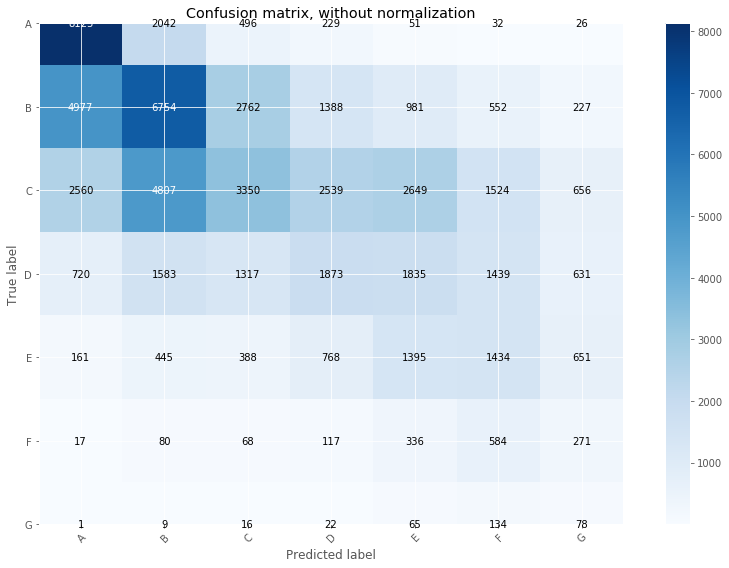

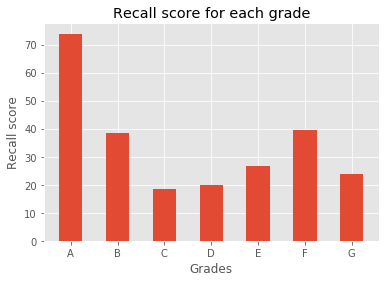

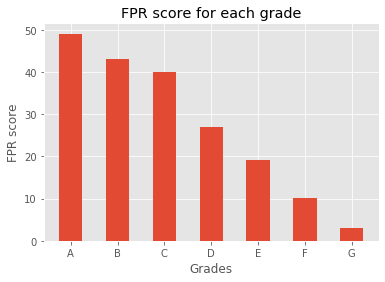

accuracy_score is  0.3508113670545397
difference metrics score is  1.64378383651173


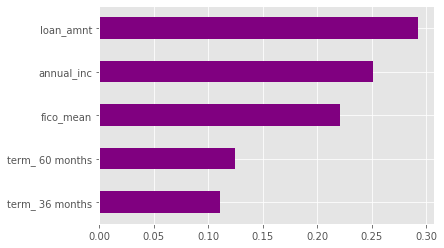

In [427]:
evaluate_model(rf, X_train, y_train, X_test, y_test)

In [304]:
models["rf_class_weight_max_depth_20"] = rf

# DT model

In [418]:
clf = DecisionTreeClassifier(class_weight = "balanced",max_depth = 8, min_samples_split = 100, random_state = SEED)

# Build classification tree
# Build classification tree
tree_est = clf.fit(X_train, y_train)

In [419]:
# use sklearn's export to generate the dot-data string file with all the nodes and their props.
predictors = X_train.columns.tolist()

dot_data = export_graphviz(tree_est, out_file='seat_tree.dot',feature_names=predictors, 
                class_names=y_train.unique(),filled=True, rounded=True,  
                        special_characters=True)

with open('seat_tree.dot') as f:
    dot_graph = f.read()  

# create the source object
I = graphviz.Source(dot_graph, format='png', engine='dot')
# Use ipython Image to shrink the rendered image of the source obj to fit into jupyter nb.
Image(I.render())

# Attempt to equilibrate the model

In [207]:
df_m2 = df[["loan_amnt", "term", "dti", "fico_mean", "grade"]]


In [208]:
df_m2_hot_method = encode(df_m2)

In [216]:
X_train, X_test, y_train, y_test = train_test_split_method(df_m2_hot_method)

In [217]:
df_m2_train_all = pd.concat([X_train, y_train], axis = 1)

In [230]:
def rebalance_data(df, max_rows_per_grade = 8000):
    
    n_rows_per_grade = df.shape[0]
        
    if n_rows_per_grade > max_rows_per_grade:
        
        random_rows = random.sample(range(n_rows_per_grade), max_rows_per_grade)
        
        df = df.iloc[random_rows, :]
    
    return df

In [231]:
df_m2_train = df_m2_train_all.groupby("grade").apply(lambda x: rebalance_data(x))
df_m2_train = df_m2_train.reset_index(drop = True)

In [233]:
X_train, X_val, y_train, y_val = train_test_split_method(df_m2_train)

In [243]:
rf = RandomForestClassifier(random_state = SEED)

rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [245]:
#validation score
y_pred = rf.predict(X_val)

print(accuracy_score(y_val, y_pred))
confusion_matrix(y_val, y_pred)

0.3113548214524542


array([[753, 234, 128,  62,  16,   6,   1],
       [306, 346, 222, 163,  83,  75,   5],
       [188, 269, 257, 208, 140, 127,  11],
       [102, 204, 228, 243, 215, 187,  21],
       [ 49, 143, 176, 216, 304, 281,  31],
       [ 20,  88, 141, 183, 304, 413,  51],
       [  7,  21,  24,  40,  65, 108,  12]])

# Model on default rate

In [3]:
def download_df(path):
    
    df =  pd.read_csv(path, header = 1)
    df = df.set_index("id")
    df["fico_mean"] = (df["fico_range_low"] + df["fico_range_high"])/2
    
    return df
 

In [13]:
df_m2 = df_2013 [["loan_amnt", "term", "annual_inc", "fico_mean", "loan_status"]]
df_m2 = df_m2.dropna()
#df_m2_clean_hot_method = encode(df_m2)


In [15]:
df_m2

,loan_amnt,term,annual_inc,fico_mean,loan_status
id,,,,,
10224583,11100.0,36 months,90000.0,692.0,Fully Paid
10148122,12000.0,36 months,96500.0,707.0,Fully Paid
10149342,27050.0,36 months,55000.0,732.0,Fully Paid
10129454,12000.0,36 months,60000.0,722.0,Fully Paid
10149488,4800.0,36 months,39600.0,757.0,Fully Paid
...,...,...,...,...,...
1062400,20500.0,36 months,60000.0,702.0,Fully Paid
1059394,15000.0,36 months,57600.0,682.0,Fully Paid
1059224,35000.0,36 months,160000.0,722.0,Fully Paid


In [491]:
df_m2_clean_hot_method["loan_status"] = df_m2_clean_hot_method["loan_status"].map({"Charged Off":1, "Fully Paid":0})



In [573]:
X_train, X_test, y_train, y_test = train_test_split_method(df_m2_clean_hot_method, "loan_status")

In [550]:
def grid_cv_model(model, param_grid, X_train, y_train, X_test, number_cv = 5, print_score_best = True, score = None):
      
    '''
    Compute a grid search cv for a model
    
        @model: Model with the fixed initialized parameters
        @param_grid: grid parameters for the cv model
        X_train: X training data with predictors already encoded
        y_train: y training data 
        X_test: X test data with predictors already encoded
        number_cv: Number of cross folders for each model 
        print_score_best: Boolean see the performance and parameters of the best model
        score: loss function to use in the CV
    '''
    model_cv = GridSearchCV(model, param_grid, cv = number_cv, scoring = score)
    
    model_cv.fit(X_train, y_train)
    
    if print_score_best == True: 
        
        print("Best model is ", model_cv.best_params_)
        print("Best model score is ", model_cv.best_score_)
    
    best_model = model_cv.best_estimator_
    
    return best_model

In [551]:
#with class weights
param_grid = {'n_estimators': [200],  
              "max_depth":[5, 10, 20, 30, 50], 
              "min_samples_leaf":[100, 50, 40, 30, 20, 10, 5]}

rf = RandomForestClassifier(random_state = SEED, class_weight = "balanced")

model_rf = grid_cv_model(rf, param_grid, X_train, y_train, X_test, score = "roc_auc")

Best model is  {'max_depth': 10, 'min_samples_leaf': 100, 'n_estimators': 200}
Best model score is  0.6608764915010946


Confusion matrix, without normalization
[[17710  6067]
 [ 2334  2117]]
0.55


<Figure size 432x288 with 0 Axes>

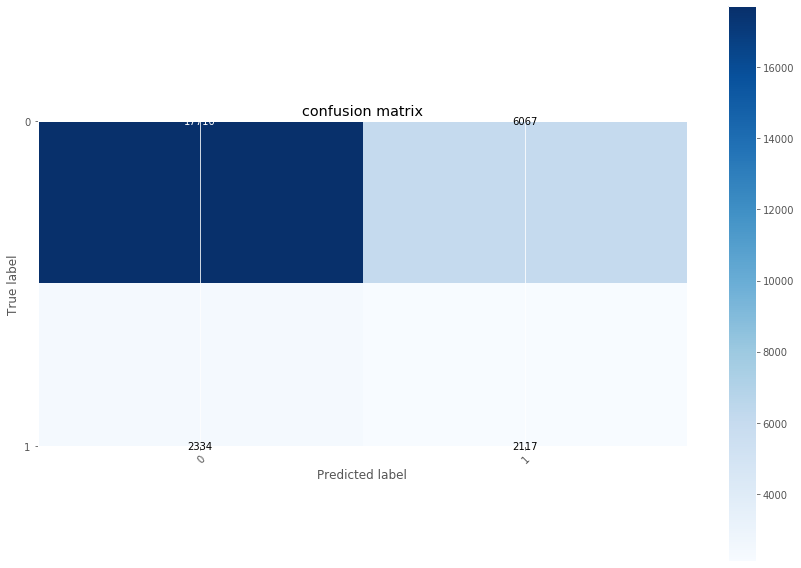

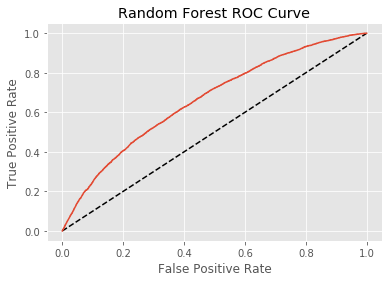

              precision    recall  f1-score   support

       False       0.74      0.88      0.81     20044
        True       0.48      0.26      0.34      8184

    accuracy                           0.70     28228
   macro avg       0.61      0.57      0.57     28228
weighted avg       0.67      0.70      0.67     28228

AUC score is 0.6126513157570861
recall on test set is  0.47562345540328016
recall on training set is  0.6299762093576526
accuracy on training set is  0.6284846173563484
accuracy on test set is  0.7023877001558736


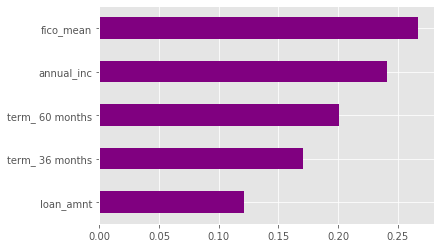

In [619]:
evaluate_model(model_rf, X_train, y_train, X_test, y_test, multi_class = False, treshold = 0.55)

In [562]:
model_rf.predict_proba(X_test)[:,1]

array([0.26611394, 0.34862478, 0.71676298, ..., 0.43144751, 0.73809596,
       0.35212945])

In [577]:
for i in range(y_test.size):
    
    print("proba is ", model_rf.predict_proba(X_test)[:,1][i], " and value is ", y_test.iloc[i])
    
    if i == 200:
        break

proba is  0.2661139374435664  and value is  0
proba is  0.34862478249388557  and value is  0
proba is  0.7167629775457292  and value is  0
proba is  0.6667713144047411  and value is  1
proba is  0.4497206152972498  and value is  0
proba is  0.4338135168258008  and value is  1
proba is  0.5849983747663777  and value is  0
proba is  0.3961491830293674  and value is  0
proba is  0.6989169330187707  and value is  0
proba is  0.35497474452552064  and value is  0
proba is  0.7042685764751035  and value is  0
proba is  0.6172310202239076  and value is  1
proba is  0.5482901257439718  and value is  0
proba is  0.22013517642335764  and value is  0
proba is  0.4555244194803745  and value is  0
proba is  0.5367086697021264  and value is  0
proba is  0.4666342919026431  and value is  0
proba is  0.6268758666845227  and value is  1
proba is  0.6066146318123792  and value is  0
proba is  0.5704592873850184  and value is  0
proba is  0.26149614992491993  and value is  0
proba is  0.7552241281790356  

proba is  0.3322581350730296  and value is  0
proba is  0.7015607231932556  and value is  0
proba is  0.49962902347357807  and value is  0
proba is  0.5874013946535454  and value is  0
proba is  0.48925957476705295  and value is  0
proba is  0.45707655558315774  and value is  1
proba is  0.6344050932394086  and value is  1
proba is  0.15565505141631786  and value is  0
proba is  0.6680831880309251  and value is  0
proba is  0.6866749743048366  and value is  1
proba is  0.387585898442014  and value is  0
proba is  0.23001174284638576  and value is  0
proba is  0.5601843532291549  and value is  0
proba is  0.5506550749515822  and value is  0
proba is  0.5254629303963183  and value is  1
proba is  0.540870162260263  and value is  0
proba is  0.3475384563151235  and value is  0
proba is  0.3843846913255738  and value is  0
proba is  0.39735213087364357  and value is  0
proba is  0.670711238442386  and value is  0
proba is  0.7072805439533677  and value is  1
proba is  0.7674486289148342  a

In [595]:
y_pred_proba = model_rf.predict_proba(X_test)[:,1]
y_test[y_pred_proba > 0.6].value_counts()
score = y_test[y_pred_proba > 0.6].value_counts()[1]/y_test[y_pred_proba > 0.6].value_counts().sum()
print(y_test[y_pred_proba > 0.6].value_counts())
score

0    3528
1    1482
Name: loan_status, dtype: int64


0.19181636726546905

In [603]:
def get_score_by_percentage(model_rf, y_test, percentage, on_1 = True):
    
    y_pred_proba = model_rf.predict_proba(X_test)[:,1]
    
    if on_1 == True:
        score = y_test[y_pred_proba > percentage].value_counts()[1]/y_test[y_pred_proba > percentage].value_counts().sum()
        print(y_test[y_pred_proba > percentage].value_counts())
        print(score)
    else:
        score = y_test[y_pred_proba < percentage].value_counts()[1]/y_test[y_pred_proba < percentage].value_counts().sum()
        print(y_test[y_pred_proba < percentage].value_counts())
        print(score)

In [610]:
get_score_by_percentage(model_rf, y_test, 0.5, on_1 = False)

0    14855
1     1778
Name: loan_status, dtype: int64
0.10689592977815186


In [546]:
rf = RandomForestClassifier(random_state = SEED, class_weight = "balanced")

rf.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

Confusion matrix, without normalization
[[20154  3623]
 [ 3491   960]]
0.35


<Figure size 432x288 with 0 Axes>

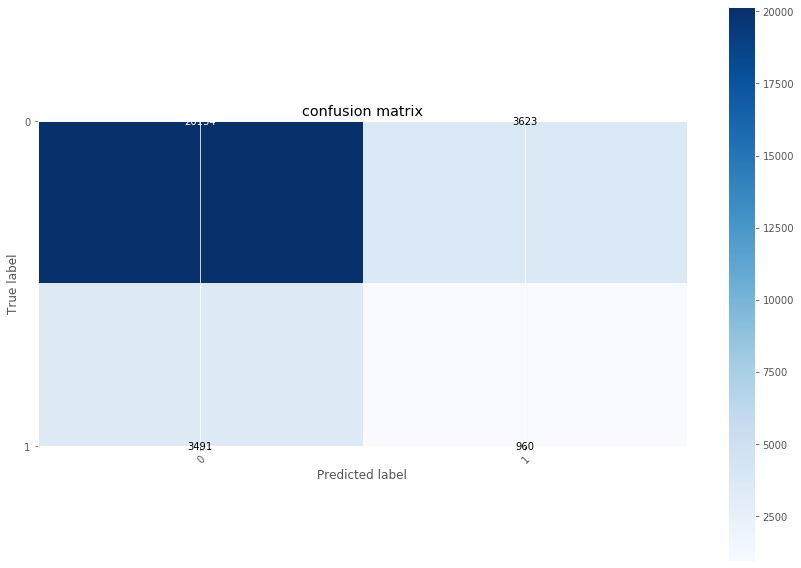

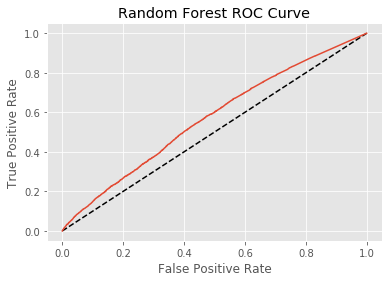

              precision    recall  f1-score   support

           0       0.86      0.73      0.79     23777
           1       0.19      0.34      0.25      4451

    accuracy                           0.67     28228
   macro avg       0.52      0.54      0.52     28228
weighted avg       0.75      0.67      0.70     28228

AUC score is 0.5365859660949294
recall on test set is  0.21568186924286678
recall on training set is  0.8753766851704996
accuracy on training set is  0.9018774264940326
accuracy on test set is  0.747980728354825


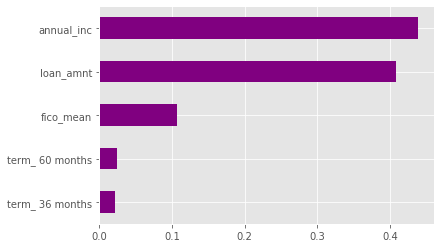

In [549]:
evaluate_model(rf, X_train, y_train, X_test, y_test, multi_class = False, treshold = 0.35)

# Model 2 with balanced data

In [505]:
X_train_val, X_test, y_train_val, y_test = train_test_split_method(df_m2_clean_hot_method, "loan_status", test_size = 0.1)



In [517]:
df_m2_all = pd.concat([X_train_val, y_train_val], axis = 1)

In [520]:
def equilibrate(df):
    
    n_rows_to_select = df[df["loan_status"] == 1].shape[0]
    
    df_temp = df[df["loan_status"] == 0]
    n_rows_to_pick_from = df_temp.shape[0]
    
    random_rows = random.sample(range(n_rows_to_pick_from), n_rows_to_select)
    
    df_temp = df_temp.iloc[random_rows, :]
    
    df = df_temp.append(df[df["loan_status"] == 1])
    
    return df

df_m2_train = equilibrate(df_m2_all)

In [572]:
X_train, X_val, y_train, y_val = train_test_split_method(df_m2_train, "loan_status", test_size = 0.5)


In [536]:
gb_clf = RandomForestClassifier(random_state = SEED)

gb_clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

Confusion matrix, without normalization
[[2207 1799]
 [1832 2174]]
0.5


<Figure size 432x288 with 0 Axes>

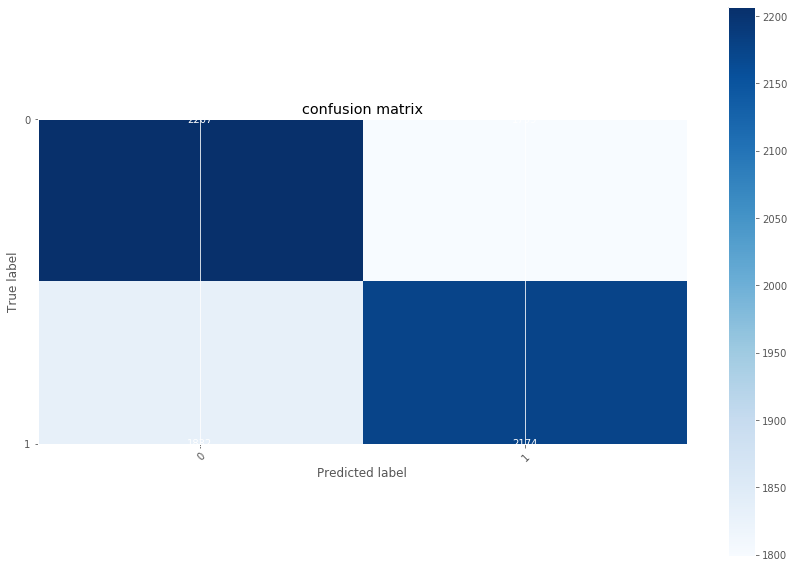

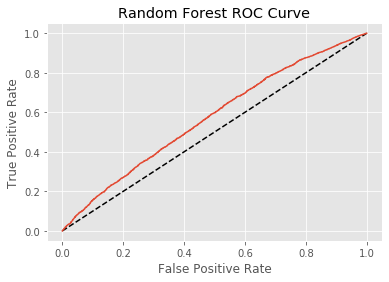

              precision    recall  f1-score   support

           0       0.55      0.55      0.55      4006
           1       0.55      0.54      0.54      4006

    accuracy                           0.55      8012
   macro avg       0.55      0.55      0.55      8012
weighted avg       0.55      0.55      0.55      8012

AUC score is 0.5468047928107839
recall on test set is  0.5426859710434349
recall on training set is  0.8648295003965107
accuracy on training set is  0.6587435059048595
accuracy on test set is  0.5468047928107839


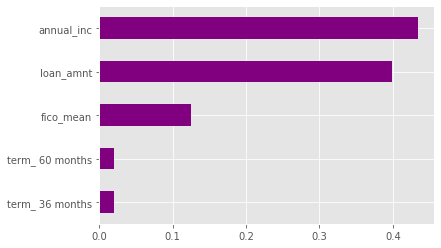

In [571]:
evaluate_model(gb_clf, X_train, y_train, X_val, y_val, multi_class = False)

Confusion matrix, without normalization
[[8967 6885]
 [1314 1653]]
0.5


<Figure size 432x288 with 0 Axes>

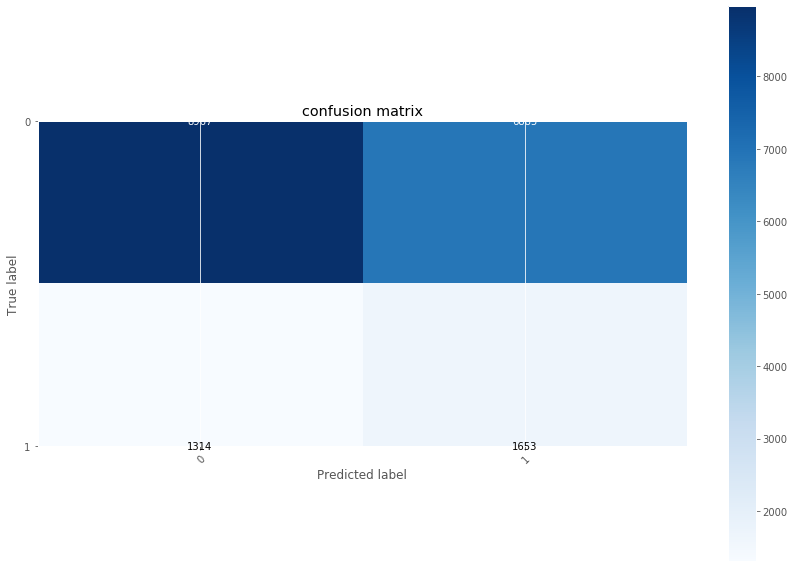

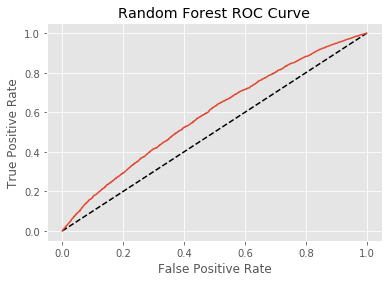

              precision    recall  f1-score   support

           0       0.87      0.56      0.68     15852
           1       0.19      0.56      0.29      2967

    accuracy                           0.56     18819
   macro avg       0.53      0.56      0.49     18819
weighted avg       0.77      0.56      0.62     18819

AUC score is 0.5619813150305646
recall on test set is  0.5571284125379171
recall on training set is  0.9220636179399067
accuracy on training set is  0.9203013481363996
accuracy on test set is  0.5643232902917265


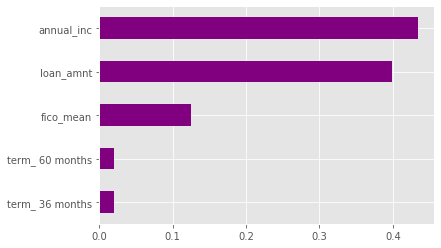

In [542]:
evaluate_model(gb_clf, X_train, y_train, X_test, y_test, multi_class = False)

In [620]:
m = pd.read_csv("MERGED2016_17_PP.csv")

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (6,1379,1380,1381,1382,1383,1384,1385,1386,1387,1388,1389,1390,1391,1392,1393,1394,1395,1396,1397,1398,1399,1400,1401,1402,1403,1404,1405,1406,1407,1408,1431,1432,1503,1504,1517,1518,1519,1529,1530,1531,1532,1534,1535,1537,1538,1539,1540,1542,1575,1576,1577,1578,1579,1580,1581,1582,1583,1584,1585,1586,1587,1588,1589,1590,1591,1592,1593,1594,1595,1596,1597,1598,1599,1600,1601,1602,1606,1610,1611,1614,1615,1616,1708,1729,1909,1910,1911,1912,1913) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [621]:
m.head(50)

,UNITID,OPEID,OPEID6,INSTNM,CITY,STABBR,ZIP,ACCREDAGENCY,INSTURL,NPCURL,SCH_DEG,HCM2,MAIN,NUMBRANCH,PREDDEG,HIGHDEG,CONTROL,ST_FIPS,REGION,LOCALE,LOCALE2,LATITUDE,LONGITUDE,CCBASIC,CCUGPROF,CCSIZSET,HBCU,PBI,ANNHI,TRIBAL,AANAPII,HSI,NANTI,MENONLY,WOMENONLY,RELAFFIL,ADM_RATE,ADM_RATE_ALL,SATVR25,SATVR75,SATMT25,SATMT75,SATWR25,SATWR75,SATVRMID,SATMTMID,SATWRMID,ACTCM25,ACTCM75,ACTEN25,ACTEN75,ACTMT25,ACTMT75,ACTWR25,ACTWR75,ACTCMMID,ACTENMID,ACTMTMID,ACTWRMID,SAT_AVG,SAT_AVG_ALL,PCIP01,PCIP03,PCIP04,PCIP05,PCIP09,PCIP10,PCIP11,PCIP12,PCIP13,PCIP14,PCIP15,PCIP16,PCIP19,PCIP22,PCIP23,PCIP24,PCIP25,PCIP26,PCIP27,PCIP29,PCIP30,PCIP31,PCIP38,PCIP39,PCIP40,PCIP41,PCIP42,PCIP43,PCIP44,PCIP45,PCIP46,PCIP47,PCIP48,PCIP49,PCIP50,PCIP51,PCIP52,PCIP54,CIP01CERT1,CIP01CERT2,CIP01ASSOC,CIP01CERT4,CIP01BACHL,CIP03CERT1,CIP03CERT2,CIP03ASSOC,CIP03CERT4,CIP03BACHL,CIP04CERT1,CIP04CERT2,CIP04ASSOC,CIP04CERT4,CIP04BACHL,CIP05CERT1,CIP05CERT2,CIP05ASSOC,CIP05CERT4,CIP05BACHL,CIP09CERT1,CIP09CERT2,CIP09ASSOC,CIP09CERT4,CIP09BACHL,CIP10CERT1,CIP10CERT2,CIP10ASSOC,CIP10CERT4,CIP10BACHL,CIP11CERT1,CIP11CERT2,CIP11ASSOC,CIP11CERT4,CIP11BACHL,CIP12CERT1,CIP12CERT2,CIP12ASSOC,CIP12CERT4,CIP12BACHL,CIP13CERT1,CIP13CERT2,CIP13ASSOC,CIP13CERT4,CIP13BACHL,CIP14CERT1,CIP14CERT2,CIP14ASSOC,CIP14CERT4,CIP14BACHL,CIP15CERT1,CIP15CERT2,CIP15ASSOC,CIP15CERT4,CIP15BACHL,CIP16CERT1,CIP16CERT2,CIP16ASSOC,CIP16CERT4,CIP16BACHL,CIP19CERT1,CIP19CERT2,CIP19ASSOC,CIP19CERT4,CIP19BACHL,CIP22CERT1,CIP22CERT2,CIP22ASSOC,CIP22CERT4,CIP22BACHL,CIP23CERT1,CIP23CERT2,CIP23ASSOC,CIP23CERT4,CIP23BACHL,CIP24CERT1,CIP24CERT2,CIP24ASSOC,CIP24CERT4,CIP24BACHL,CIP25CERT1,CIP25CERT2,CIP25ASSOC,CIP25CERT4,CIP25BACHL,CIP26CERT1,CIP26CERT2,CIP26ASSOC,CIP26CERT4,CIP26BACHL,CIP27CERT1,CIP27CERT2,CIP27ASSOC,CIP27CERT4,CIP27BACHL,CIP29CERT1,CIP29CERT2,CIP29ASSOC,CIP29CERT4,CIP29BACHL,CIP30CERT1,CIP30CERT2,CIP30ASSOC,CIP30CERT4,CIP30BACHL,CIP31CERT1,CIP31CERT2,CIP31ASSOC,CIP31CERT4,CIP31BACHL,CIP38CERT1,CIP38CERT2,CIP38ASSOC,CIP38CERT4,CIP38BACHL,CIP39CERT1,CIP39CERT2,CIP39ASSOC,CIP39CERT4,CIP39BACHL,CIP40CERT1,CIP40CERT2,CIP40ASSOC,CIP40CERT4,CIP40BACHL,CIP41CERT1,CIP41CERT2,CIP41ASSOC,CIP41CERT4,CIP41BACHL,CIP42CERT1,CIP42CERT2,CIP42ASSOC,CIP42CERT4,CIP42BACHL,CIP43CERT1,CIP43CERT2,CIP43ASSOC,CIP43CERT4,CIP43BACHL,CIP44CERT1,CIP44CERT2,CIP44ASSOC,CIP44CERT4,CIP44BACHL,CIP45CERT1,CIP45CERT2,CIP45ASSOC,CIP45CERT4,CIP45BACHL,CIP46CERT1,...,C200_L4_POOLED_SUPP,C200_4_POOLED_SUPP,ALIAS,C100_4,D100_4,C100_L4,D100_L4,TRANS_4,DTRANS_4,TRANS_L4,DTRANS_L4,ICLEVEL,UGDS_MEN,UGDS_WOMEN,CDR3_DENOM,CDR2_DENOM,T4APPROVALDATE,D150_4_WHITE,D150_4_BLACK,D150_4_HISP,D150_4_ASIAN,D150_4_AIAN,D150_4_NHPI,D150_4_2MOR,D150_4_NRA,D150_4_UNKN,D150_4_WHITENH,D150_4_BLACKNH,D150_4_API,D150_4_AIANOLD,D150_4_HISPOLD,D150_L4_WHITE,D150_L4_BLACK,D150_L4_HISP,D150_L4_ASIAN,D150_L4_AIAN,D150_L4_NHPI,D150_L4_2MOR,D150_L4_NRA,D150_L4_UNKN,D150_L4_WHITENH,D150_L4_BLACKNH,D150_L4_API,D150_L4_AIANOLD,D150_L4_HISPOLD,D_PCTPELL_PCTFLOAN,OPENADMP,UGNONDS,GRADS,ACCREDCODE,OMACHT6_FTFT,OMAWDP6_FTFT,OMACHT8_FTFT,OMAWDP8_FTFT,OMENRYP8_FTFT,OMENRAP8_FTFT,OMENRUP8_FTFT,OMACHT6_PTFT,OMAWDP6_PTFT,OMACHT8_PTFT,OMAWDP8_PTFT,OMENRYP8_PTFT,OMENRAP8_PTFT,OMENRUP8_PTFT,OMACHT6_FTNFT,OMAWDP6_FTNFT,OMACHT8_FTNFT,OMAWDP8_FTNFT,OMENRYP8_FTNFT,OMENRAP8_FTNFT,OMENRUP8_FTNFT,OMACHT6_PTNFT,OMAWDP6_PTNFT,OMACHT8_PTNFT,OMAWDP8_PTNFT,OMENRYP8_PTNFT,OMENRAP8_PTNFT,OMENRUP8_PTNFT,RET_FT4_POOLED,RET_FTL4_POOLED,RET_PT4_POOLED,RET_PTL4_POOLED,RET_FT_DEN4_POOLED,RET_FT_DENL4_POOLED,RET_PT_DEN4_POOLED,RET_PT_DENL4_POOLED,POOLYRSRET_FT,POOLYRSRET_PT,RET_FT4_POOLED_SUPP,RET_FTL4_POOLED_SUPP,RET_PT4_POOLED_SUPP,RET_PTL4_POOLED_SUPP,TRANS_4_POOLED,TRANS_L4_POOLED,DTRANS_4_POOLED,DTRANS_L4_POOLED,TRANS_4_POOLED_SUPP,TRANS_L4_POOLED_SUPP,C100_4_POOLED,C100_L4_POOLED,D100_4_POOLED,D100_L4_POOLED,POOLYRS100,C100_4_POOLED_SUPP,C100_L4_POOLED_SUPP,C150_4_PELL,D150_4_PELL,C150_L4_PELL,D150_L4_PELL,C150_4_LOANNOPELL,D150_4_LOANNOPELL,C150_L4_LOANNOPELL,D150_L4_LOANNOPELL,C150